## Equipo 4
Mariana Ivette Rincón Flores A01654973

Leonardo Laureles Olmedo A01659241

Carlos Mateos Perez A01654085

Renata Vargas Caballero A01025281

Andrea Bravo Avila A01028579

Alberto Lozano Cárdenas A01067141

# Etapa 2: Comprensión de los datos del negocio y preparación de los datos

\* El pdf de este documento, suele cortar partes del código, para verlo completo revisar el archivo ipynb o la liga directo al colab incluida en el reporte.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
#data = pd.read_excel('/content/drive/MyDrive/2_DATOS_SIMA_BANDERAS/BD_Tec_Banderas_2018_2021_3Estaciones.xlsx')
#No se van a usar estos datos porque nos estamos enfocando 
#unicamente en la estación NE2 que es la estación de Apodaca 
#y no hay datos sobre esta estación en este documento.

In [ ]:
data2 = pd.read_excel('/content/drive/MyDrive/2_DATOS_SIMA_BANDERAS/BD_Tec_Banderas_meteo.xlsx',sheet_name = None)

In [ ]:
data3 = pd.read_excel('/content/drive/MyDrive/2_DATOS_SIMA_BANDERAS/BD_Tec_banderas_contaminantes.xlsx',sheet_name = None)

In [ ]:
d2=data2.keys()
d3=data3.keys()
print(d2,"\n",d3)

dict_keys(['TOUT', 'RH', 'SR', 'RAINF', 'PRS', 'WS', 'WD']) 
 dict_keys(['PM10', 'PM2.5', 'SO2', 'O3', 'CO', 'NO', 'NO2', 'NOx', 'LEEME', 'Hoja1'])


## Dimensión del dataset

In [ ]:
print("dimensiones de cada página del excel de datos meteorológicos")
print(data2['TOUT'].shape,
data2['RH'].shape,
data2['SR'].shape,
data2['RAINF'].shape,
data2['PRS'].shape,
data2['WS'].shape,
data2['WD'].shape)

dimensiones de cada página del excel de datos meteorológicos
(39297, 28) (39382, 28) (39389, 28) (39391, 28) (39270, 28) (39259, 28) (39320, 28)


In [ ]:
print("dimensiones de cada página del excel de datos de contaminantes")
print(data3['PM10'].shape,
data3['PM2.5'].shape,
data3['SO2'].shape,
data3['O3'].shape,
data3['CO'].shape,
data3['NO'].shape,
data3['NO2'].shape,
data3['NOx'].shape)

dimensiones de cada página del excel de datos de contaminantes
(39393, 28) (39394, 28) (39392, 28) (39393, 28) (39375, 28) (39393, 28) (39392, 28) (39392, 28)


## Descripción de las variables

In [ ]:
NE2_meteo=pd.DataFrame({"TOUT":data2['TOUT']['NE2'],"RH":data2['RH']['NE2'],"SR":data2['SR']['NE2'],"RAINF":data2['RAINF']['NE2'],"PRS":data2['PRS']['NE2'],"WS":data2['WS']['NE2'],"WD":data2['WD']['NE2']})

In [ ]:
NE2_cont=pd.DataFrame({"PM10":data3['PM10']['NE2'],"PM2.5":data3['PM2.5']['NE2'],"O3":data3['O3']['NE2'],"SO2":data3['SO2']['NE2'],"CO":data3['CO']['NE2'],"NO":data3['NO']['NE2'],"NO2":data3['NO2']['NE2'],"NOx":data3['NOx']['NE2']})

In [ ]:
NE2_meteo=NE2_meteo.drop_duplicates()
NE2_cont=NE2_cont.drop_duplicates()

### Visualisación contaminantes

In [ ]:
NE2_cont.describe()

,PM10,PM2.5,O3,SO2,CO,NO,NO2,NOx
count,30220.000000,22328.000000,3786.000000,13899.000000,26930.000000,2933.000000,3040.000000,3441.000000
mean,61.216777,24.122582,24.208135,9.136218,1.446544,16.066144,19.041612,31.680878
std,40.580274,18.660370,14.072121,8.926508,1.011468,34.921435,9.249564,35.643110
min,2.000000,2.000000,0.000000,0.500000,0.050000,0.100000,0.400000,0.100000
25%,36.000000,12.000000,13.000000,4.300000,0.560000,4.900000,13.100000,15.300000
50%,53.000000,20.000000,22.000000,8.000000,1.240000,8.800000,17.800000,25.500000
75%,76.000000,32.000000,33.000000,10.500000,2.260000,14.900000,23.600000,37.200000
max,687.000000,546.000000,170.000000,164.500000,12.540000,500.000000,74.800000,500.000000


/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


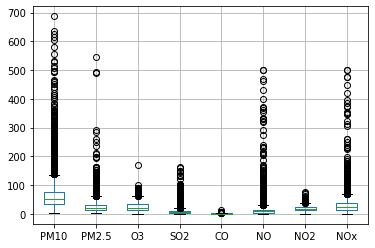

In [ ]:
NE2_cont.boxplot()

Text(0.5, 1.0, 'NO2')

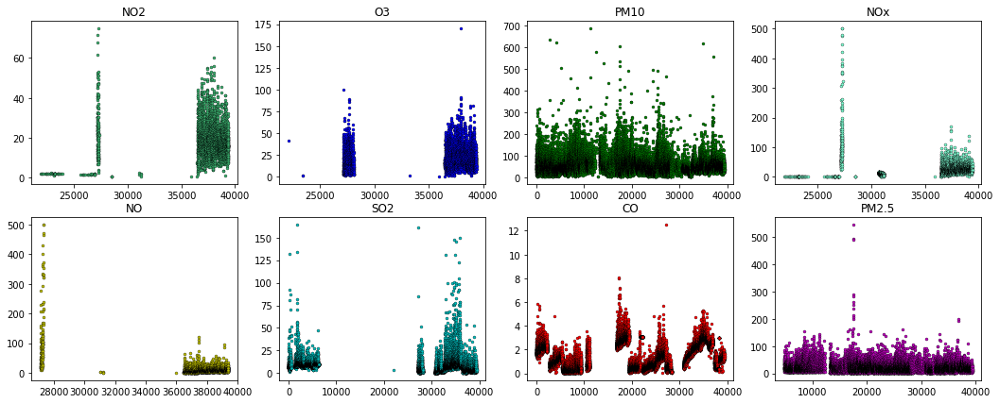

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(18, 7))
ax[1,2].plot(NE2_cont.index.values,NE2_cont['CO'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)
ax[1,2].set_title('CO')
ax[0,1].plot(NE2_cont.index.values,NE2_cont['O3'] , '.',color='b', markeredgecolor='k', markeredgewidth=0.3)
ax[0,1].set_title('O3')
ax[0,2].plot(NE2_cont.index.values,NE2_cont['PM10'] ,'.',color='g', markeredgecolor='k', markeredgewidth=0.3)
ax[0,2].set_title('PM10')
ax[1,3].plot(NE2_cont.index.values,NE2_cont['PM2.5'] ,'.',color='m', markeredgecolor='k', markeredgewidth=0.3)
ax[1,3].set_title('PM2.5')
ax[1,1].plot(NE2_cont.index.values,NE2_cont['SO2'] ,'.',color='c', markeredgecolor='k', markeredgewidth=0.3)
ax[1,1].set_title('SO2')
ax[1,0].plot(NE2_cont.index.values,NE2_cont['NO'] ,'.',color='y', markeredgecolor='k', markeredgewidth=0.3)
ax[1,0].set_title('NO')
ax[0,3].plot(NE2_cont.index.values,NE2_cont['NOx'] ,'.',color='aquamarine', markeredgecolor='k', markeredgewidth=0.3)
ax[0,3].set_title('NOx')
ax[0,0].plot(NE2_cont.index.values,NE2_cont['NO2'] ,'.',color='mediumseagreen', markeredgecolor='k', markeredgewidth=0.3)
ax[0,0].set_title('NO2')


Limpieza de datos, sustitución de valores vacios con el valor siguiente

In [ ]:
NE2_cont_l=NE2_cont.fillna(method='bfill')
NE2_cont_l.describe()

,PM10,PM2.5,O3,SO2,CO,NO,NO2,NOx
count,31576.000000,31576.000000,31576.000000,31575.000000,31558.000000,31576.000000,31575.000000,31575.000000
mean,62.192583,27.470674,26.055609,6.094961,1.597842,16.962490,3.334654,4.265989
std,41.983928,20.509407,18.254110,6.587294,1.342629,15.196873,5.977609,16.881194
min,2.000000,2.000000,0.000000,0.500000,0.050000,0.100000,0.400000,0.100000
25%,36.000000,12.000000,7.000000,2.600000,0.520000,6.900000,1.700000,0.500000
50%,53.000000,23.000000,41.000000,4.000000,1.210000,21.900000,1.900000,0.500000
75%,77.000000,44.000000,41.000000,7.400000,2.380000,21.900000,1.900000,0.500000
max,687.000000,546.000000,170.000000,164.500000,12.540000,500.000000,74.800000,500.000000


Text(0.5, 1.0, 'NO2')

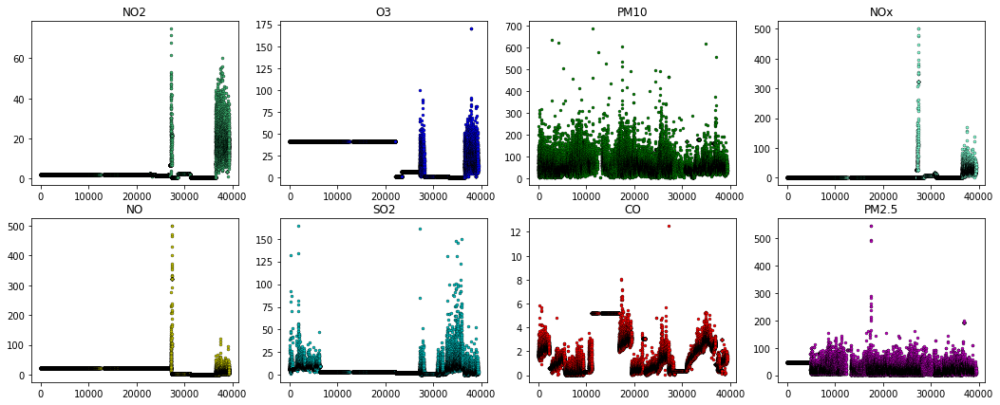

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(18, 7))
ax[1,2].plot(NE2_cont_l.index.values,NE2_cont_l['CO'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)
ax[1,2].set_title('CO')
ax[0,1].plot(NE2_cont_l.index.values,NE2_cont_l['O3'] , '.',color='b', markeredgecolor='k', markeredgewidth=0.3)
ax[0,1].set_title('O3')
ax[0,2].plot(NE2_cont_l.index.values,NE2_cont_l['PM10'] ,'.',color='g', markeredgecolor='k', markeredgewidth=0.3)
ax[0,2].set_title('PM10')
ax[1,3].plot(NE2_cont_l.index.values,NE2_cont_l['PM2.5'] ,'.',color='m', markeredgecolor='k', markeredgewidth=0.3)
ax[1,3].set_title('PM2.5')
ax[1,1].plot(NE2_cont_l.index.values,NE2_cont_l['SO2'] ,'.',color='c', markeredgecolor='k', markeredgewidth=0.3)
ax[1,1].set_title('SO2')
ax[1,0].plot(NE2_cont_l.index.values,NE2_cont_l['NO'] ,'.',color='y', markeredgecolor='k', markeredgewidth=0.3)
ax[1,0].set_title('NO')
ax[0,3].plot(NE2_cont_l.index.values,NE2_cont_l['NOx'] ,'.',color='aquamarine', markeredgecolor='k', markeredgewidth=0.3)
ax[0,3].set_title('NOx')
ax[0,0].plot(NE2_cont_l.index.values,NE2_cont_l['NO2'] ,'.',color='mediumseagreen', markeredgecolor='k', markeredgewidth=0.3)
ax[0,0].set_title('NO2')

In [ ]:
PM10=pd.DataFrame({"Fecha":data3['PM10']['Fecha'],"NE2":data3['PM10']['NE2']})
PM10.head()

,Fecha,NE2
0,2017-01-01 00:00:00,238.0
1,2017-01-01 01:00:00,131.0
2,2017-01-01 02:00:00,67.0
3,2017-01-01 03:00:00,109.0
4,2017-01-01 04:00:00,198.0


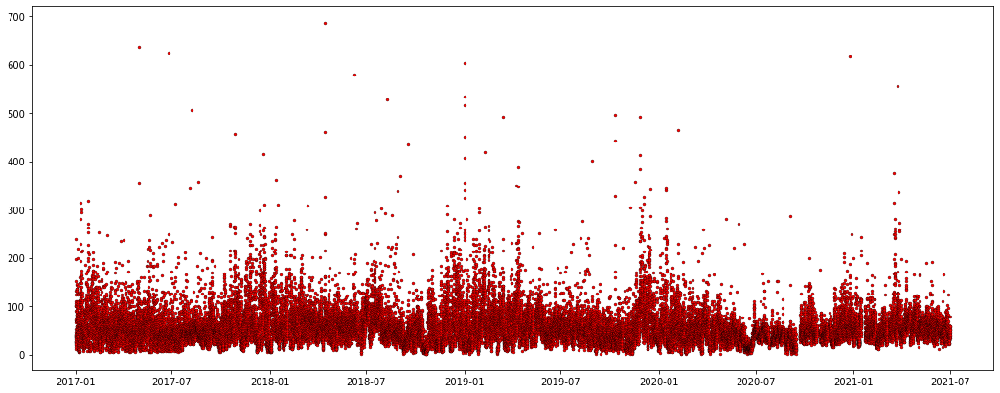

In [ ]:
fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(PM10['Fecha'],PM10['NE2'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)

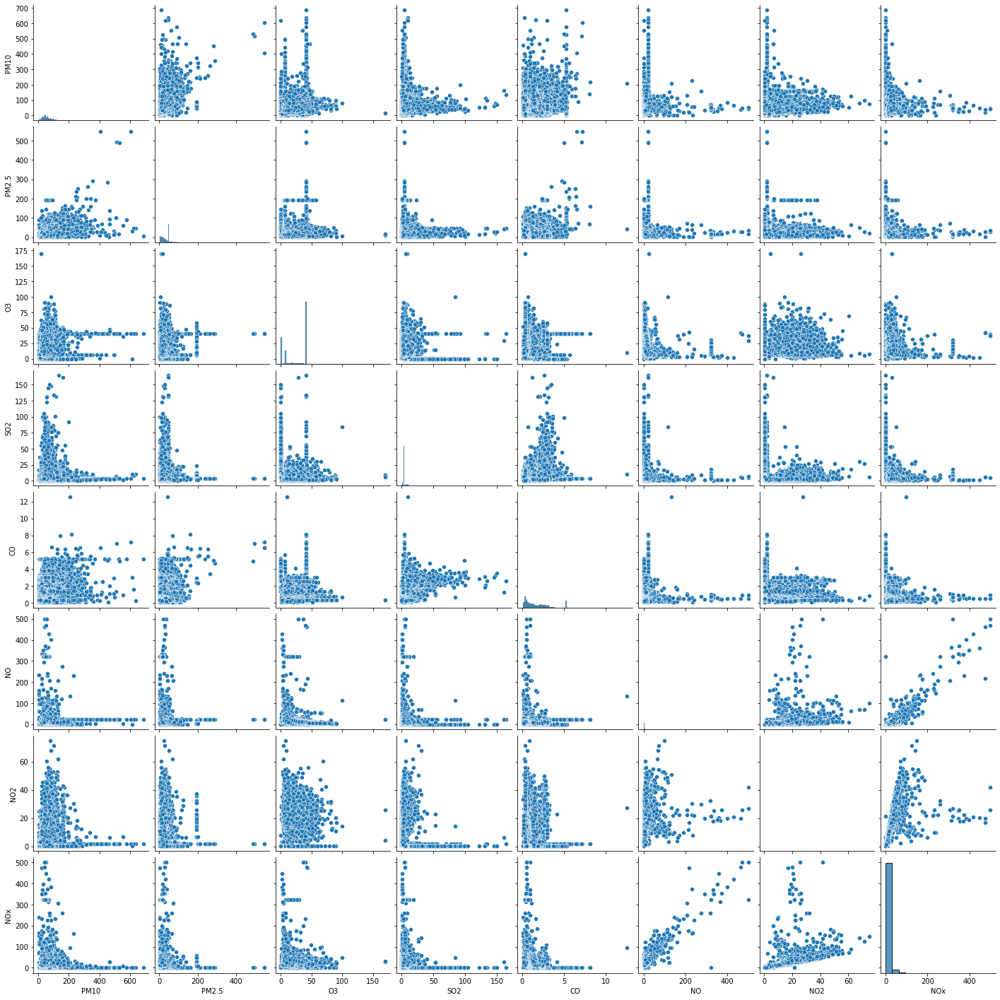

In [ ]:
sns.pairplot(NE2_cont_l)

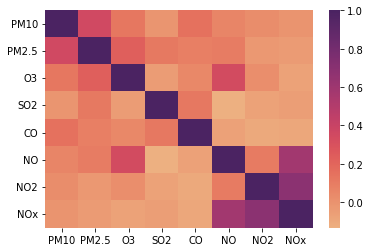

In [ ]:
sns.heatmap(NE2_cont_l.corr(),cmap="flare")

NO y NOx tienen mucha relación, si aumenta el ozono disminuye NOx porque se consumen, NOx esta relacionado con los vehiculos sube y baja con el uso de los coches, el ozono aumenta con el sol y el calor. depende del dia, la hora del dia, el dia de la semana.

### Visualizacion meteorologico

In [ ]:
NE2_meteo.describe()

,TOUT,RH,SR,RAINF,PRS,WS,WD
count,38625.000000,38627.000000,39078.000000,37990.000000,38206.000000,32061.000000,15009.000000
mean,23.375006,59.017708,0.209317,0.011592,715.356441,7.153230,171.946832
std,7.263281,21.160506,0.254326,0.290854,5.014999,79.178607,94.539106
min,-5.670000,0.000000,0.000000,0.000000,620.300000,-9999.000000,1.000000
25%,18.680000,42.000000,0.001000,0.000000,712.100000,3.700000,112.000000
50%,24.090000,61.000000,0.045000,0.000000,714.800000,7.400000,138.000000
75%,28.330000,77.000000,0.467000,0.000000,718.200000,11.000000,251.000000
max,42.670000,98.000000,0.900000,29.300000,736.400000,34.700000,360.000000


Si hay temperaturas negativas, en apodaca si se puede esperar variaciones de entre -5º y 43º. La humedad se mide en un porcentaje por lo que 0% y 98% son minimos y máximos adecuados. La radiación solar máxima es de $1kW/m^2$ por lo que valores entre 0 y 0.9 son válidos. La precipitación no es mucha en Apodaca por lo que la mayoría de los estadísticos siendo 0 es razonable, y cuando han habido huracanes si llueve lo suficiente para generar ese máximo. La presión atmosférica de 1 atmosfera a nivel del mar es 760, a mayor altura menor presión por lo que como monterrey no esta a nivel del mar la presión no puede ser mayor a 760, tiene valores adecuados. La velocidad del viento no puede tener valores negaivos, por lo que -9999 es un valor erroneo que se corregirá, el máximo es un valor razonable. La dirección del viento son en grados por lo que 1º a 360º es válido.

In [ ]:
#hay dos datos de -9999, se cambian por 0 porque es un error de medicion
x=NE2_meteo['WS'].idxmin()
NE2_meteo['WS'][x]=0
x=NE2_meteo['WS'].idxmin()
NE2_meteo['WS'][x]=0

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


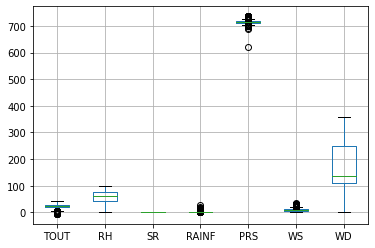

In [ ]:
NE2_meteo.boxplot()

Text(0.5, 1.0, 'Dirección del Viento')

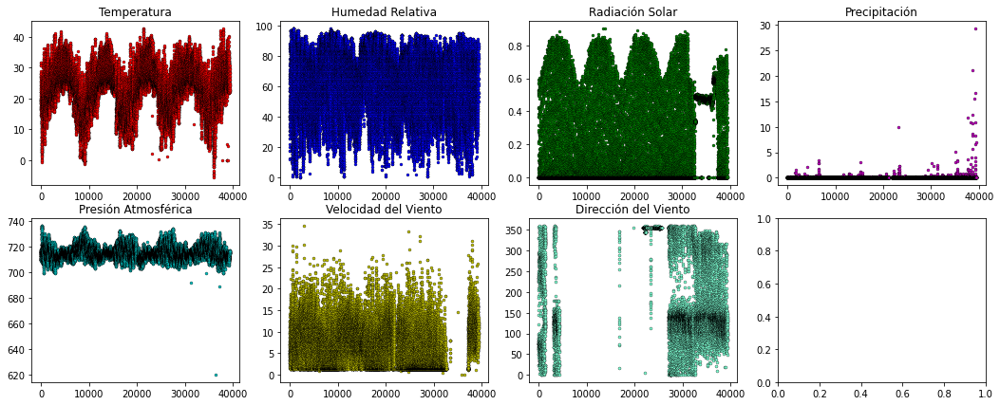

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(18, 7))
ax[0,0].plot(NE2_meteo.index.values,NE2_meteo['TOUT'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)
ax[0,0].set_title('Temperatura')
ax[0,1].plot(NE2_meteo.index.values,NE2_meteo['RH'] , '.',color='b', markeredgecolor='k', markeredgewidth=0.3)
ax[0,1].set_title('Humedad Relativa')
ax[0,2].plot(NE2_meteo.index.values,NE2_meteo['SR'] ,'.',color='g', markeredgecolor='k', markeredgewidth=0.3)
ax[0,2].set_title('Radiación Solar')
ax[0,3].plot(NE2_meteo.index.values,NE2_meteo['RAINF'] ,'.',color='m', markeredgecolor='k', markeredgewidth=0.3)
ax[0,3].set_title('Precipitación')
ax[1,0].plot(NE2_meteo.index.values,NE2_meteo['PRS'] ,'.',color='c', markeredgecolor='k', markeredgewidth=0.3)
ax[1,0].set_title('Presión Atmosférica')
ax[1,1].plot(NE2_meteo.index.values,NE2_meteo['WS'] ,'.',color='y', markeredgecolor='k', markeredgewidth=0.3)
ax[1,1].set_title('Velocidad del Viento')
ax[1,2].plot(NE2_meteo.index.values,NE2_meteo['WD'] ,'.',color='aquamarine', markeredgecolor='k', markeredgewidth=0.3)
ax[1,2].set_title('Dirección del Viento')

In [ ]:
NE2_meteo_l=NE2_meteo.fillna(method='bfill')
NE2_meteo_l.describe()

,TOUT,RH,SR,RAINF,PRS,WS,WD
count,39204.000000,39272.000000,39276.000000,39276.000000,39177.000000,39166.000000,39227.000000
mean,23.372479,58.967203,0.209397,0.015572,715.368918,7.363918,240.206134
std,7.279006,21.213477,0.254249,0.437536,4.989245,5.191717,96.115668
min,-5.670000,0.000000,0.000000,0.000000,620.300000,0.000000,1.000000
25%,18.650000,42.000000,0.001000,0.000000,712.100000,2.800000,140.000000
50%,24.040000,61.000000,0.045000,0.000000,714.800000,6.700000,254.000000
75%,28.310000,77.000000,0.467000,0.000000,718.200000,11.000000,354.000000
max,42.670000,98.000000,0.900000,29.300000,736.400000,34.700000,360.000000


Text(0.5, 1.0, 'Dirección del Viento')

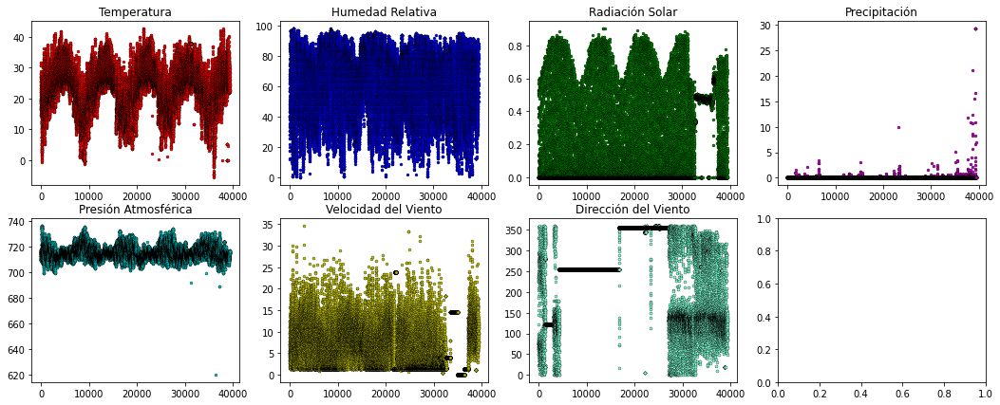

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(18, 7))
ax[0,0].plot(NE2_meteo_l.index.values,NE2_meteo_l['TOUT'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)
ax[0,0].set_title('Temperatura')
ax[0,1].plot(NE2_meteo_l.index.values,NE2_meteo_l['RH'] , '.',color='b', markeredgecolor='k', markeredgewidth=0.3)
ax[0,1].set_title('Humedad Relativa')
ax[0,2].plot(NE2_meteo_l.index.values,NE2_meteo_l['SR'] ,'.',color='g', markeredgecolor='k', markeredgewidth=0.3)
ax[0,2].set_title('Radiación Solar')
ax[0,3].plot(NE2_meteo_l.index.values,NE2_meteo_l['RAINF'] ,'.',color='m', markeredgecolor='k', markeredgewidth=0.3)
ax[0,3].set_title('Precipitación')
ax[1,0].plot(NE2_meteo_l.index.values,NE2_meteo_l['PRS'] ,'.',color='c', markeredgecolor='k', markeredgewidth=0.3)
ax[1,0].set_title('Presión Atmosférica')
ax[1,1].plot(NE2_meteo_l.index.values,NE2_meteo_l['WS'] ,'.',color='y', markeredgecolor='k', markeredgewidth=0.3)
ax[1,1].set_title('Velocidad del Viento')
ax[1,2].plot(NE2_meteo_l.index.values,NE2_meteo_l['WD'] ,'.',color='aquamarine', markeredgecolor='k', markeredgewidth=0.3)
ax[1,2].set_title('Dirección del Viento')

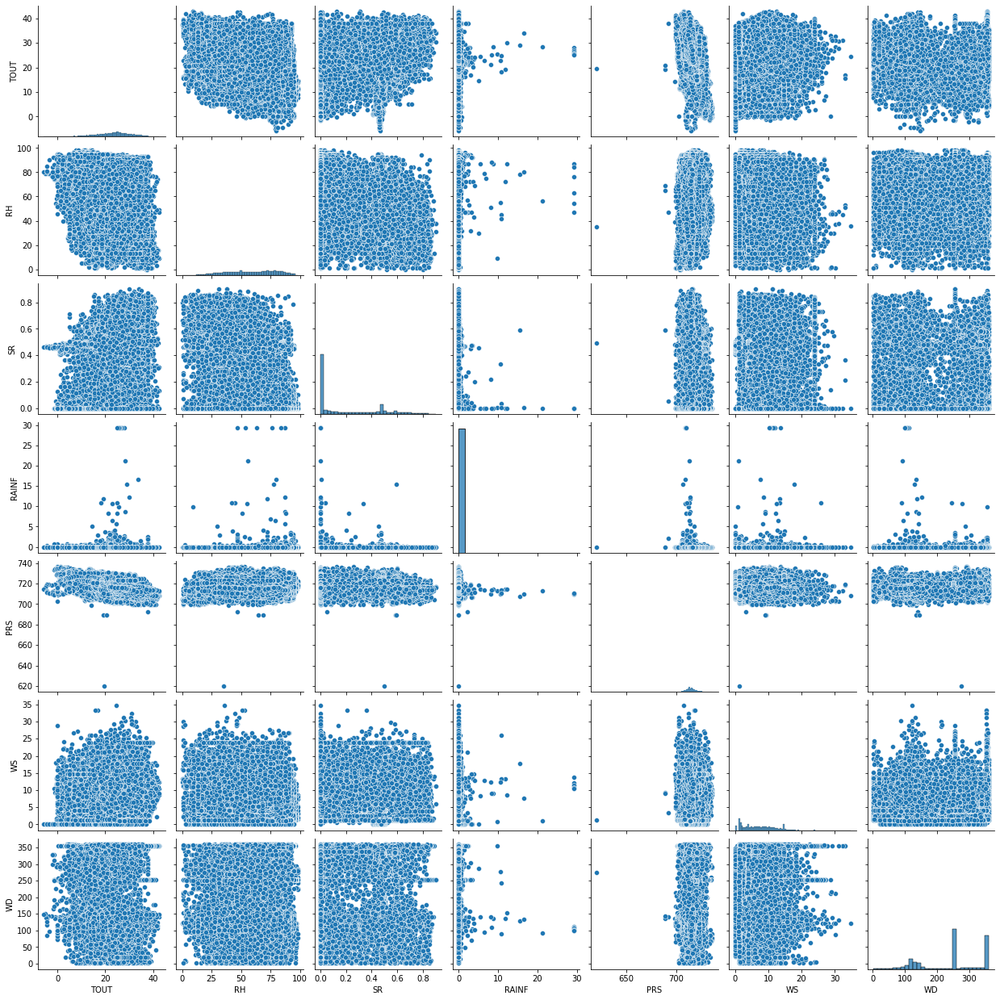

In [ ]:
sns.pairplot(NE2_meteo_l)

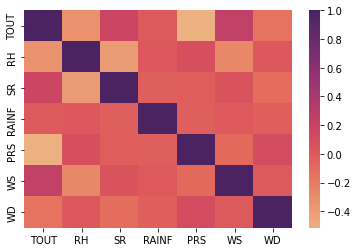

In [ ]:
sns.heatmap(NE2_meteo_l.corr(),cmap='flare')

## Unión de data frames

In [ ]:
comp=pd.concat([NE2_meteo_l,NE2_cont_l],axis=1)
comp.head()


,TOUT,RH,SR,RAINF,PRS,WS,WD,PM10,PM2.5,O3,SO2,CO,NO,NO2,NOx
0,17.44,68.0,0.001,0.0,712.2,4.2,273.0,238.0,48.0,41.0,13.2,2.43,21.9,1.9,0.5
1,18.77,63.0,0.001,0.0,711.6,8.6,246.0,131.0,48.0,41.0,15.6,1.83,21.9,1.9,0.5
2,19.95,57.0,0.001,0.0,711.0,8.8,239.0,67.0,48.0,41.0,11.6,1.98,21.9,1.9,0.5
3,19.25,62.0,0.001,0.0,711.0,8.7,85.0,109.0,48.0,41.0,10.9,2.69,21.9,1.9,0.5
4,19.27,62.0,0.001,0.0,710.6,7.7,62.0,198.0,48.0,41.0,15.0,2.45,21.9,1.9,0.5


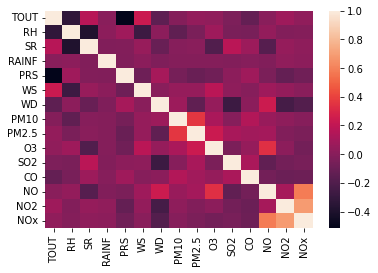

In [ ]:
sns.heatmap(comp.loc[:, comp.columns!='Fecha'].corr())

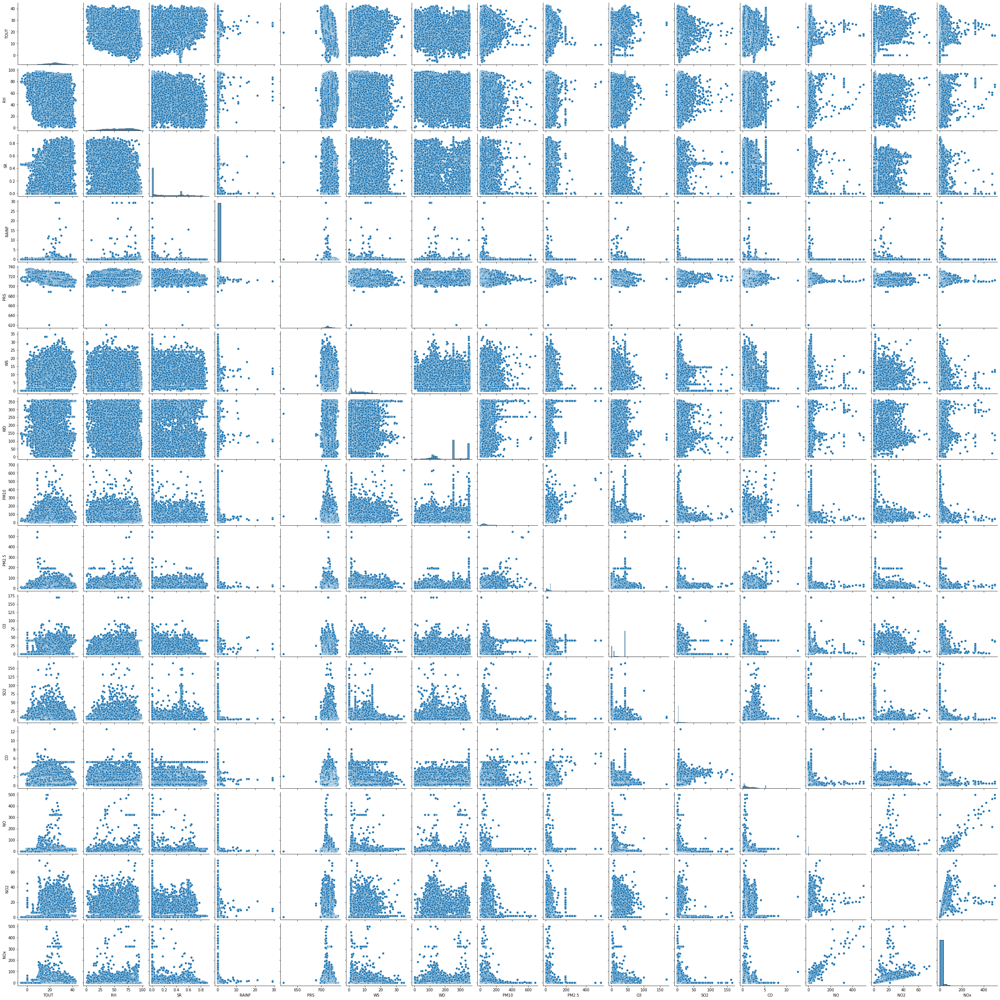

In [ ]:
sns.pairplot(comp.loc[:, comp.columns!='Fecha'])

In [ ]:
comp_l=comp.fillna(method='ffill')

# Etapa 3. Modelo

## Modelo de clustering

In [ ]:
pip install kneed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons
from sklearn.metrics import adjusted_rand_score

Text(0.5, 1.0, 'Silhouette Score')

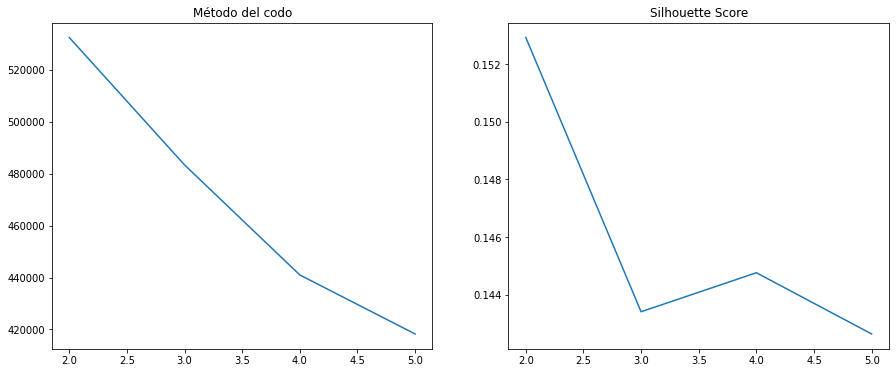

In [ ]:
scaler = StandardScaler()
datos_norm = scaler.fit_transform(comp_l)
datos_norm = pd.DataFrame(datos_norm, columns=comp_l.columns)


grupos = np.arange(2, 6)
wcss   = np.zeros(4)
sil_score = np.zeros(4)

for k in grupos:
    # Clustering
    model = KMeans(n_clusters=k)
    clusters = model.fit_predict(datos_norm)
    # WCSS
    wcss[k-2] = model.inertia_
    # Silhouette Score
    sil_score[k-2] = silhouette_score(datos_norm, clusters)
    
# Vamos a graficar el codo y silhouette score en la misma gráfica
# Recordemos que subplots nos permite tener más gráficas en la misma figura
fig, axs = plt.subplots(1,2, figsize=(15,6))

#codo
axs[0].plot(grupos, wcss)
axs[0].set_title('Método del codo')

#Silhouette Score
axs[1].plot(grupos, sil_score)
axs[1].set_title('Silhouette Score')


In [ ]:
# Generamos los grupos
model = KMeans(n_clusters=3)
clusters = model.fit_predict(datos_norm)

# Agregamos los clusters a nuestros DATOS ORIGINALES
comp_l['Grupo'] = clusters

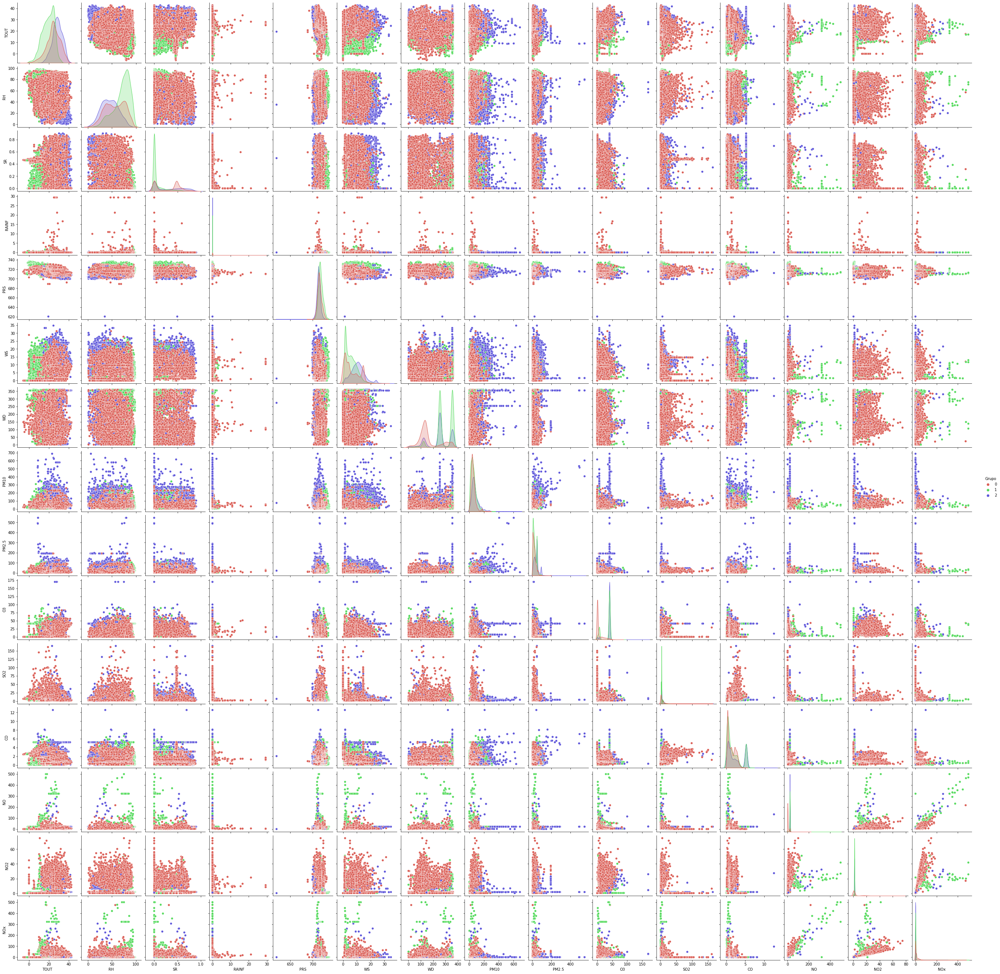

In [ ]:
sns.pairplot(comp_l.loc[:, comp_l.columns!='Fecha'], hue='Grupo', palette=sns.color_palette("hls", 3))

### datos del clustering a csv

In [ ]:
comp_l.to_csv('comp_l.csv')

## Creacion de base de solo los ultimos años

In [ ]:
so2=pd.DataFrame({"Fecha3":data3['SO2']['Fecha'],"SO2":data3['SO2']['NE2']})
so2.head()

,Fecha3,SO2
0,2017-01-01 00:00:00,13.2
1,2017-01-01 01:00:00,15.6
2,2017-01-01 02:00:00,11.6
3,2017-01-01 03:00:00,10.9
4,2017-01-01 04:00:00,15.0


In [ ]:
so2_year=so2
for i in range(len(so2['Fecha3'])):
  if (so2['Fecha3'][i].year==2017 or so2['Fecha3'][i].year==2018 ):
    so2_year=so2_year.drop(index=i)

In [ ]:
pm2=pd.DataFrame({"Fecha2":data3['PM2.5']['Fecha'],"PM2.5":data3['PM2.5']['NE2']})
pm2.head()

,Fecha2,PM2.5
0,2017-01-01 00:00:00,NaN
1,2017-01-01 01:00:00,NaN
2,2017-01-01 02:00:00,NaN
3,2017-01-01 03:00:00,NaN
4,2017-01-01 04:00:00,NaN


In [ ]:
pm2_year=pm2
for i in range(len(pm2['Fecha2'])):
  if (pm2['Fecha2'][i].year==2017 or pm2['Fecha2'][i].year==2018):
    pm2_year=pm2_year.drop(index=i)

In [ ]:
PM10=pd.DataFrame({"Fecha":data3['PM10']['Fecha'],"PM10":data3['PM10']['NE2']})

In [ ]:
pm10_year=PM10
for i in range(len(PM10['Fecha'])):
  if (PM10['Fecha'][i].year==2017 or PM10['Fecha'][i].year==2018):
    pm10_year=pm10_year.drop(index=i)

### Visualisación inicial


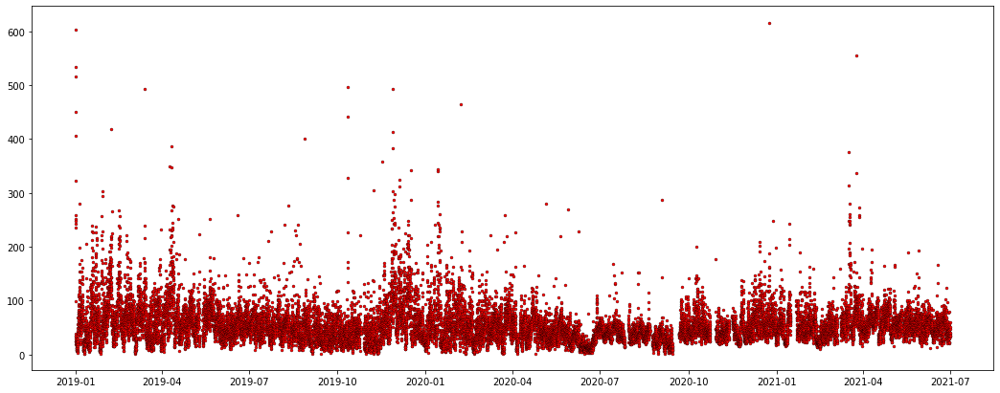

In [ ]:
fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(pm10_year['Fecha'],pm10_year['PM10'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)

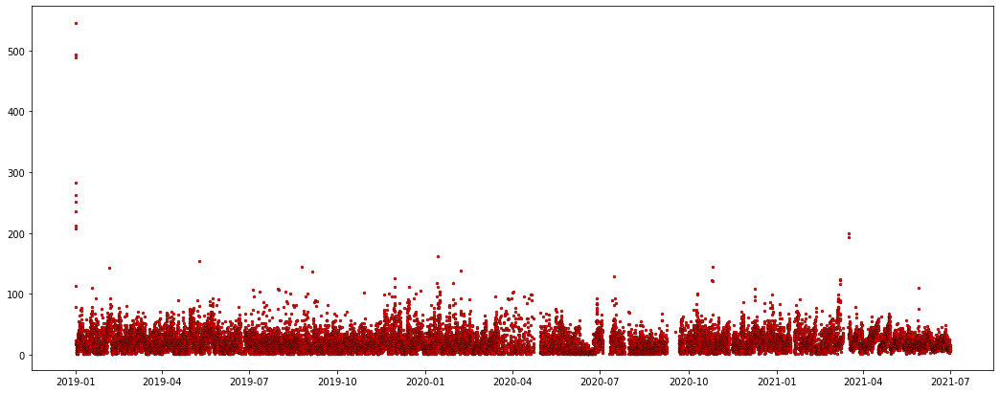

In [ ]:
fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(pm2_year['Fecha2'],pm2_year['PM2.5'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)

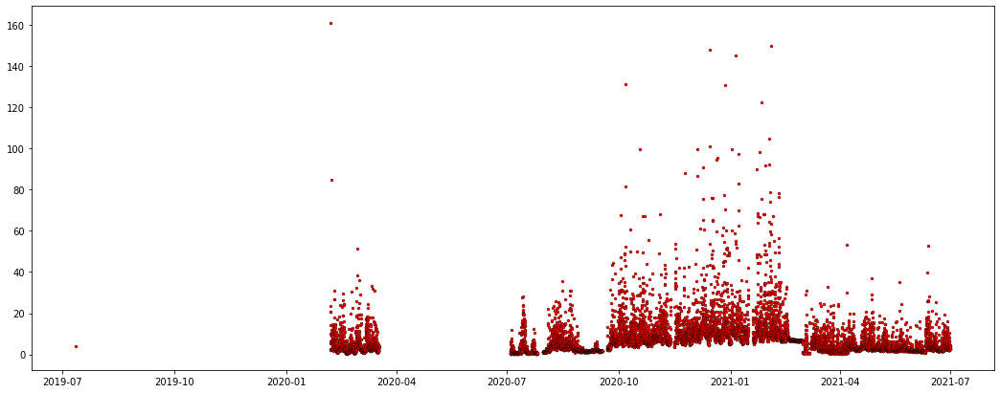

In [ ]:
fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(so2_year['Fecha3'],so2_year['SO2'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)

### Limpieza y visualisación

In [ ]:
so2_l=so2_year.fillna(method='bfill')
pm2_l=pm2_year.fillna(method='bfill')
pm10_l=pm10_year.fillna(method='bfill')

In [ ]:
pm2_l=pm2_l.drop(index=21873)
pm2_l=pm2_l.drop(index=21872)
pm10_l=pm10_l.drop(index=21873)


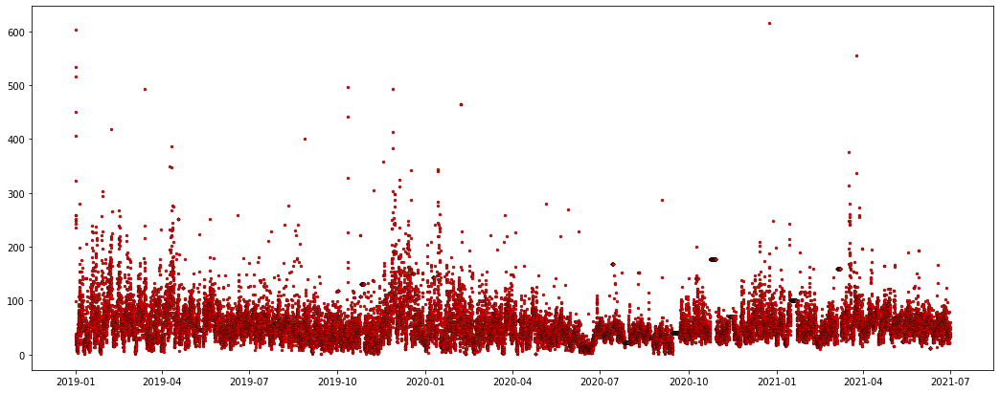

In [ ]:
fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(pm10_l['Fecha'],pm10_l['PM10'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)

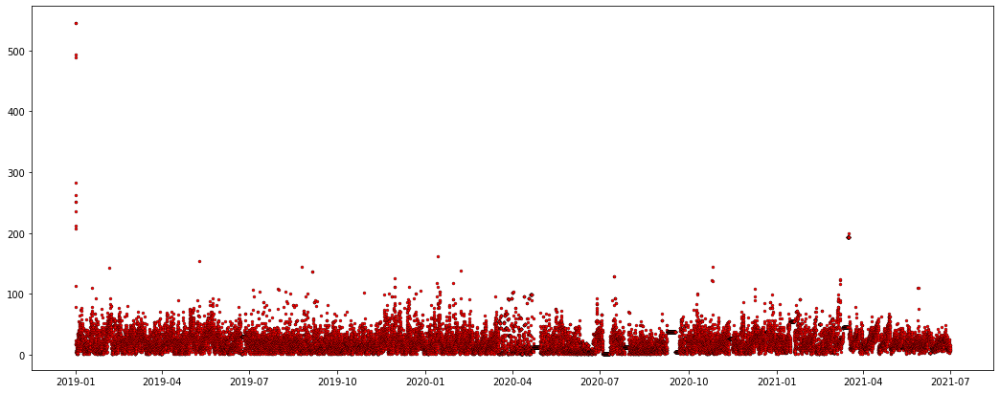

In [ ]:
fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(pm2_l['Fecha2'],pm2_l['PM2.5'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)

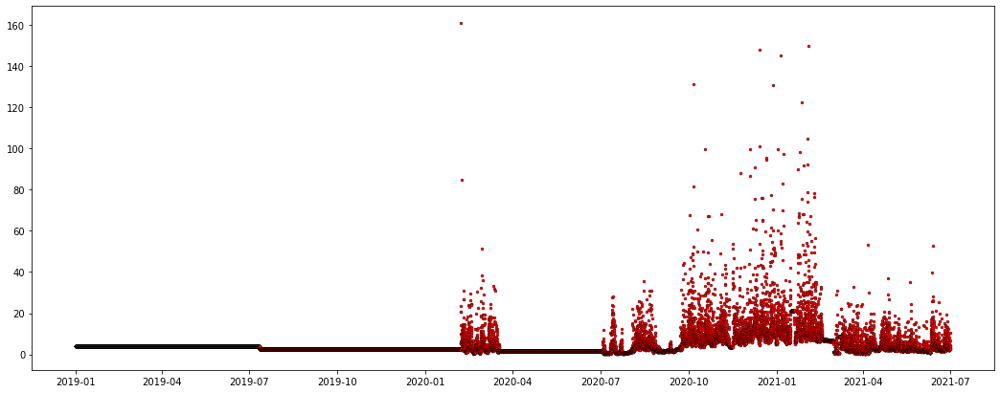

In [ ]:
fig, ax = plt.subplots(figsize=(18, 7))
ax.plot(so2_l['Fecha3'],so2_l['SO2'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)

In [ ]:
print(len(so2_l) , len(pm10_l) , len(pm2_l))


21872 21872 21872


### Unión de contaminantes


In [ ]:
comp2=pd.concat([so2_l,pm10_l,pm2_l],axis=1)
comp2.describe()
comp2.head()

,Fecha3,SO2,Fecha,PM10,Fecha2,PM2.5
17520,2019-01-01 00:00:00,4.0,2019-01-01 00:00:00,258.0,2019-01-01 00:00:00,251.0
17521,2019-01-01 01:00:00,4.0,2019-01-01 01:00:00,258.0,2019-01-01 01:00:00,251.0
17522,2019-01-01 02:00:00,4.0,2019-01-01 02:00:00,406.0,2019-01-01 02:00:00,546.0
17523,2019-01-01 03:00:00,4.0,2019-01-01 03:00:00,603.0,2019-01-01 03:00:00,546.0
17524,2019-01-01 04:00:00,4.0,2019-01-01 04:00:00,515.0,2019-01-01 04:00:00,494.0


In [ ]:
comp2_l=comp2.drop(columns=['Fecha','Fecha2'])
comp2_l=comp2_l.rename(columns={'Fecha3':'Fecha'})
comp2_l=comp2_l.fillna(method='bfill')
comp2_l=comp2_l.reset_index(drop=True)
comp2_l.head()

,Fecha,SO2,PM10,PM2.5
0,2019-01-01 00:00:00,4.0,258.0,251.0
1,2019-01-01 01:00:00,4.0,258.0,251.0
2,2019-01-01 02:00:00,4.0,406.0,546.0
3,2019-01-01 03:00:00,4.0,603.0,546.0
4,2019-01-01 04:00:00,4.0,515.0,494.0


In [ ]:
comp2_l.corr()

,SO2,PM10,PM2.5
SO2,1.000000,0.059155,0.060058
PM10,0.059155,1.000000,0.455756
PM2.5,0.060058,0.455756,1.000000


In [ ]:
comp2_l.to_csv('comp_cont_l.csv')

## Clustering con datos limpios

In [ ]:
ll=comp2_l.loc[:, comp2_l.columns!='Fecha']
ll=ll.fillna(0)

Text(0.5, 1.0, 'Silhouette Score')

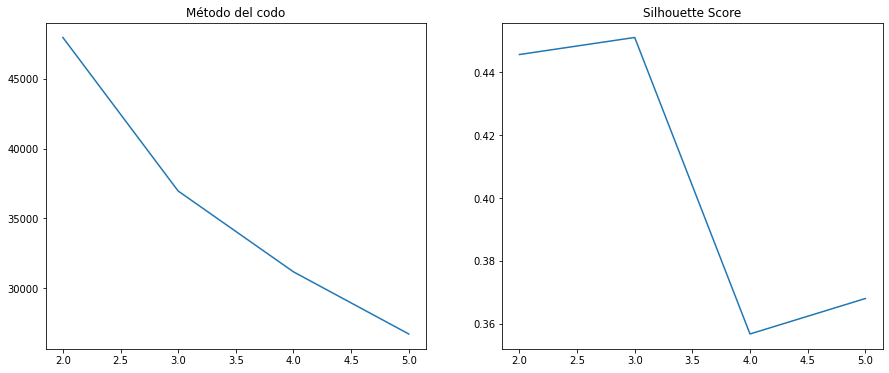

In [ ]:

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons
from sklearn.metrics import adjusted_rand_score


scaler = StandardScaler()
datos_norm = scaler.fit_transform(ll)
datos_norm = pd.DataFrame(datos_norm, columns=ll.columns)


grupos = np.arange(2, 6)
wcss   = np.zeros(4)
sil_score = np.zeros(4)

for k in grupos:
    # Clustering
    model = KMeans(n_clusters=k)
    clusters = model.fit_predict(datos_norm)
    # WCSS
    wcss[k-2] = model.inertia_
    # Silhouette Score
    sil_score[k-2] = silhouette_score(datos_norm, clusters)
    
# Vamos a graficar el codo y silhouette score en la misma gráfica
# Recordemos que subplots nos permite tener más gráficas en la misma figura
fig, axs = plt.subplots(1,2, figsize=(15,6))

#codo
axs[0].plot(grupos, wcss)
axs[0].set_title('Método del codo')

#Silhouette Score
axs[1].plot(grupos, sil_score)
axs[1].set_title('Silhouette Score')


In [ ]:

# Generamos los grupos
model = KMeans(n_clusters=3)
clusters = model.fit_predict(datos_norm)

# Agregamos los clusters a nuestros DATOS ORIGINALES
ll['Grupo'] = clusters

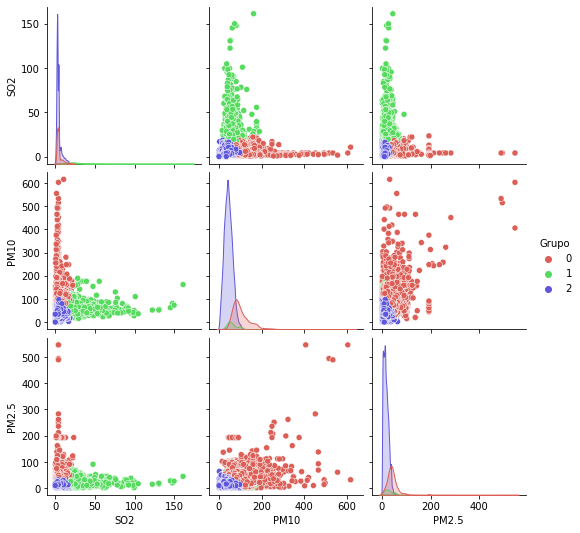

In [ ]:
sns.pairplot(ll, hue='Grupo', palette=sns.color_palette("hls", 3))

## Data frame con ultimos años de meteorológicos

In [ ]:
wd=pd.DataFrame({"Fecha":data2['WD']['Fecha'],"WD":data2['WD']['NE2']})
temp=pd.DataFrame({"Fecha2":data2['TOUT']['Fecha'],"TOUT":data2['TOUT']['NE2']})
gh=pd.DataFrame({"Fecha3":data2['RH']['Fecha'],"RH":data2['RH']['NE2']})
sr=pd.DataFrame({"Fecha4":data2['SR']['Fecha'],"SR":data2['SR']['NE2']})
rain=pd.DataFrame({"Fecha5":data2['RAINF']['Fecha'],"RAINF":data2['RAINF']['NE2']})
prs=pd.DataFrame({"Fecha6":data2['PRS']['Fecha'],"PRS":data2['PRS']['NE2']})
ws=pd.DataFrame({"Fecha7":data2['WS']['Fecha'],"WS":data2['WS']['NE2']})

In [ ]:
wd2=wd
for i in range(len(wd['Fecha'])):
  if (wd['Fecha'][i].year==2017 or wd['Fecha'][i].year==2018 ):
    wd2=wd2.drop(index=i)

In [ ]:
temp2=temp
for i in range(len(temp['Fecha2'])):
  if (temp['Fecha2'][i].year==2017 or temp['Fecha2'][i].year==2018 ):
    temp2=temp2.drop(index=i)

In [ ]:
gh2=gh
for i in range(len(gh['Fecha3'])):
  if (gh['Fecha3'][i].year==2017 or gh['Fecha3'][i].year==2018 ):
    gh2=gh2.drop(index=i)

In [ ]:
sr2=sr
for i in range(len(sr['Fecha4'])):
  if (sr['Fecha4'][i].year==2017 or sr['Fecha4'][i].year==2018 ):
    sr2=sr2.drop(index=i)

In [ ]:
rain2=rain
for i in range(len(rain['Fecha5'])):
  if (rain['Fecha5'][i].year==2017 or rain['Fecha5'][i].year==2018 ):
    rain2=rain2.drop(index=i)

In [ ]:
prs2=prs
for i in range(len(prs['Fecha6'])):
  if (prs['Fecha6'][i].year==2017 or prs['Fecha6'][i].year==2018 ):
    prs2=prs2.drop(index=i)

In [ ]:
ws2=ws
for i in range(len(ws['Fecha7'])):
  if (ws['Fecha7'][i].year==2017 or ws['Fecha7'][i].year==2018 ):
    ws2=ws2.drop(index=i)

Text(0.5, 1.0, 'Dirección del Viento')

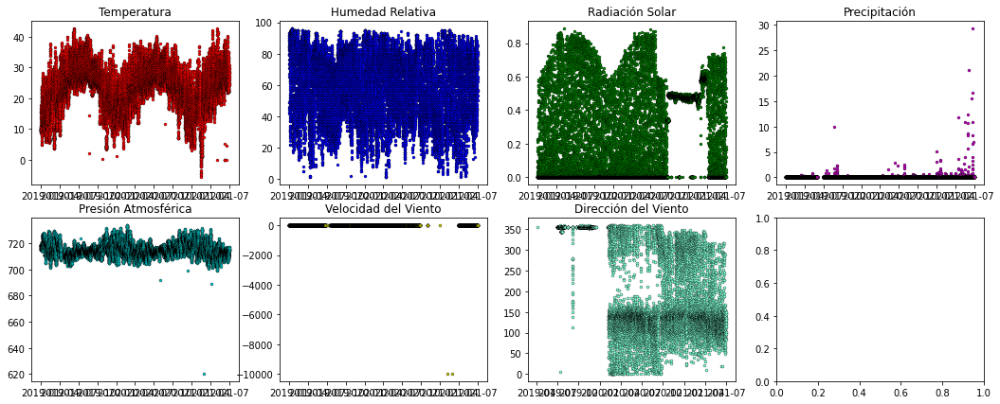

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(18, 7))
ax[0,0].plot(temp2['Fecha2'],temp2['TOUT'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)
ax[0,0].set_title('Temperatura')
ax[0,1].plot(gh2['Fecha3'],gh2['RH'] , '.',color='b', markeredgecolor='k', markeredgewidth=0.3)
ax[0,1].set_title('Humedad Relativa')
ax[0,2].plot(sr2['Fecha4'],sr2['SR'] ,'.',color='g', markeredgecolor='k', markeredgewidth=0.3)
ax[0,2].set_title('Radiación Solar')
ax[0,3].plot(rain2['Fecha5'],rain2['RAINF'] ,'.',color='m', markeredgecolor='k', markeredgewidth=0.3)
ax[0,3].set_title('Precipitación')
ax[1,0].plot(prs2['Fecha6'],prs2['PRS'] ,'.',color='c', markeredgecolor='k', markeredgewidth=0.3)
ax[1,0].set_title('Presión Atmosférica')
ax[1,1].plot(ws2['Fecha7'],ws2['WS'] ,'.',color='y', markeredgecolor='k', markeredgewidth=0.3)
ax[1,1].set_title('Velocidad del Viento')
ax[1,2].plot(wd2['Fecha'],wd2['WD'] ,'.',color='aquamarine', markeredgecolor='k', markeredgewidth=0.3)
ax[1,2].set_title('Dirección del Viento')

### Limpieza 

In [ ]:
#hay dos datos de -9999, se cambian por 0 porque es un error de medicion
x=ws2['WS'].idxmin()
ws2['WS'][x]=0
x=ws2['WS'].idxmin()
ws2['WS'][x]=0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [ ]:
wd2=wd2.fillna(method='bfill')
temp2=temp2.fillna(method='bfill')
gh2=gh2.fillna(method='bfill')
sr2=sr2.fillna(method='bfill')
rain2=rain2.fillna(method='bfill')
prs2=prs2.fillna(method='bfill')
ws2=ws2.fillna(method='bfill')

Text(0.5, 1.0, 'Dirección del Viento')

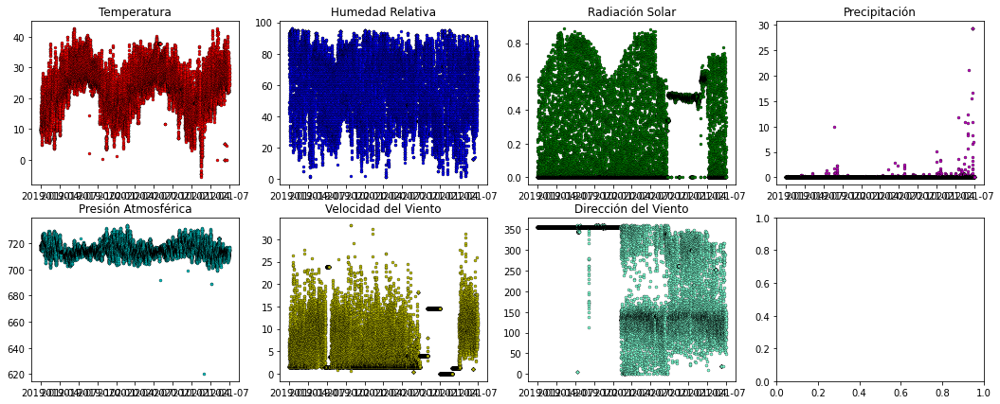

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(18, 7))
ax[0,0].plot(temp2['Fecha2'],temp2['TOUT'] ,'.',color='r', markeredgecolor='k', markeredgewidth=0.3)
ax[0,0].set_title('Temperatura')
ax[0,1].plot(gh2['Fecha3'],gh2['RH'] , '.',color='b', markeredgecolor='k', markeredgewidth=0.3)
ax[0,1].set_title('Humedad Relativa')
ax[0,2].plot(sr2['Fecha4'],sr2['SR'] ,'.',color='g', markeredgecolor='k', markeredgewidth=0.3)
ax[0,2].set_title('Radiación Solar')
ax[0,3].plot(rain2['Fecha5'],rain2['RAINF'] ,'.',color='m', markeredgecolor='k', markeredgewidth=0.3)
ax[0,3].set_title('Precipitación')
ax[1,0].plot(prs2['Fecha6'],prs2['PRS'] ,'.',color='c', markeredgecolor='k', markeredgewidth=0.3)
ax[1,0].set_title('Presión Atmosférica')
ax[1,1].plot(ws2['Fecha7'],ws2['WS'] ,'.',color='y', markeredgecolor='k', markeredgewidth=0.3)
ax[1,1].set_title('Velocidad del Viento')
ax[1,2].plot(wd2['Fecha'],wd2['WD'] ,'.',color='aquamarine', markeredgecolor='k', markeredgewidth=0.3)
ax[1,2].set_title('Dirección del Viento')

## Union de data frames

In [ ]:
print(len(wd2) , len(temp2) , len(gh2), len(sr2), len(prs2), len(rain2), len(ws2))

21827 21778 21864 21871 21752 21872 21741


In [ ]:
comp3=pd.concat([wd2,temp2,gh2,sr2,prs2,ws2,rain2],axis=1)
print(comp3.describe())
print(comp3.tail())

                 WD          TOUT            RH            SR           PRS  \
count  21827.000000  21778.000000  21864.000000  21871.000000  21752.000000   
mean     248.331974     23.356635     57.722741      0.238134    715.198704   
std      113.470672      7.319485     20.834027      0.255726      5.016031   
min        1.000000     -5.670000      1.000000      0.000000    620.300000   
25%      134.000000     18.560000     41.000000      0.001000    711.900000   
50%      310.000000     23.970000     59.000000      0.115000    714.600000   
75%      355.000000     28.350000     76.000000      0.480000    718.100000   
max      360.000000     42.670000     96.000000      0.887000    734.100000   

                 WS         RAINF  
count  21741.000000  21872.000000  
mean       6.772297      0.024416  
std        5.508471      0.583340  
min        0.000000      0.000000  
25%        1.800000      0.000000  
50%        5.300000      0.000000  
75%       10.800000      0.000000  


In [ ]:
comp3_l=comp3.drop(columns=['Fecha','Fecha3','Fecha4','Fecha5','Fecha6','Fecha7'])
comp3_l.head()

,WD,Fecha2,TOUT,RH,SR,PRS,WS,RAINF
17493,355.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN
17494,355.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN
17495,355.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN
17496,355.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN
17497,355.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
comp3_l=comp3_l.fillna(method='bfill')
print(comp3_l.describe())
print(comp3_l.head())

                 WD          TOUT            RH            SR           PRS  \
count  21827.000000  21804.000000  21889.000000  21896.000000  21777.000000   
mean     248.331974     23.340195     57.750468      0.237862    715.203380   
std      113.470672      7.330577     20.838266      0.255707      4.971741   
min        1.000000     -5.670000      1.000000      0.000000    689.000000   
25%      134.000000     18.540000     41.000000      0.001000    711.900000   
50%      310.000000     23.960000     59.000000      0.114000    714.600000   
75%      355.000000     28.350000     76.000000      0.480000    718.100000   
max      360.000000     42.670000     96.000000      0.887000    734.100000   

                 WS         RAINF  
count  21766.000000  21898.000000  
mean       6.766126      0.024387  
std        5.508313      0.582994  
min        0.000000      0.000000  
25%        1.800000      0.000000  
50%        5.200000      0.000000  
75%       10.700000      0.000000  


In [ ]:
for i in range(len(comp3_l['PRS'])):
  if (comp3_l['PRS'][i]<640):
    comp3_l['PRS'][i]=714.6

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
comp3_l.to_csv('comp_meteo_l')

In [ ]:
comp3_l=comp3_l.reset_index(drop=True)
comp3_l

,WD,Fecha2,TOUT,RH,SR,PRS,WS,RAINF
0,355.0,2019-01-01,9.57,82.0,0.0,715.5,1.4,0.0
1,355.0,2019-01-01,9.57,82.0,0.0,715.5,1.4,0.0
2,355.0,2019-01-01,9.57,82.0,0.0,715.5,1.4,0.0
3,355.0,2019-01-01,9.57,82.0,0.0,715.5,1.4,0.0
4,355.0,2019-01-01,9.57,82.0,0.0,715.5,1.4,0.0
...,...,...,...,...,...,...,...,...
21893,NaN,NaT,NaN,NaN,0.0,NaN,NaN,0.0
21894,NaN,NaT,NaN,NaN,0.0,NaN,NaN,0.0
21895,NaN,NaT,NaN,NaN,0.0,NaN,NaN,0.0
21896,NaN,NaT,NaN,NaN,NaN,NaN,NaN,0.0


In [ ]:
comp_comp=pd.concat([comp3_l,comp2_l],axis=1)
comp_comp=comp_comp.fillna(method='bfill')
comp_comp=comp_comp.fillna(method='ffill')
comp_comp=comp_comp.reset_index(drop=True)
comp_comp=comp_comp.drop(columns=['Fecha2'])

In [ ]:
comp_comp.tail()

,WD,TOUT,RH,SR,PRS,WS,RAINF,Fecha,SO2,PM10,PM2.5
21893,116.0,24.36,81.0,0.0,716.3,9.6,0.0,2021-06-30 23:00:00,3.8,34.0,10.0
21894,116.0,24.36,81.0,0.0,716.3,9.6,0.0,2021-06-30 23:00:00,3.8,34.0,10.0
21895,116.0,24.36,81.0,0.0,716.3,9.6,0.0,2021-06-30 23:00:00,3.8,34.0,10.0
21896,116.0,24.36,81.0,0.0,716.3,9.6,0.0,2021-06-30 23:00:00,3.8,34.0,10.0
21897,116.0,24.36,81.0,0.0,716.3,9.6,0.0,2021-06-30 23:00:00,3.8,34.0,10.0


In [ ]:
comp_comp=comp_comp.iloc[:, [7,0,1,2,3,4,5,6,8,9,10]]

In [ ]:
comp_comp.to_csv('datos_limpios_completos.csv')

## Analizis datos limpios completos

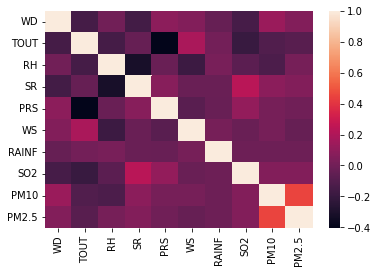

In [ ]:
sns.heatmap(comp_comp.corr())

Text(0.5, 1.0, 'Silhouette Score')

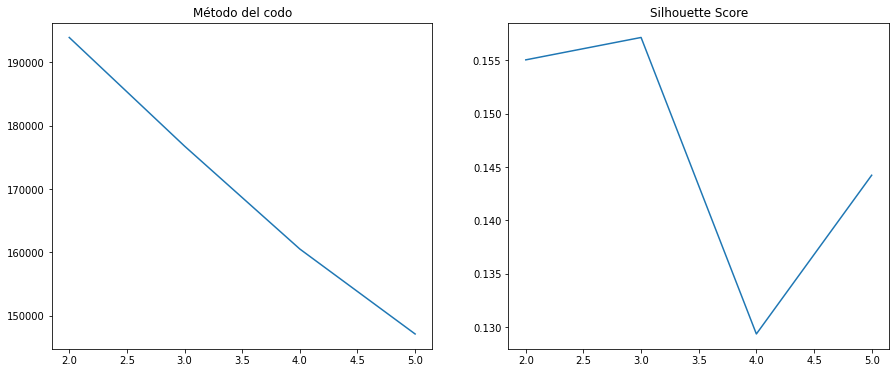

In [ ]:
ll2=comp_comp.loc[:, comp_comp.columns!='Fecha']

scaler = StandardScaler()
datos_norm = scaler.fit_transform(ll2)
datos_norm = pd.DataFrame(datos_norm, columns=ll2.columns)


grupos = np.arange(2, 6)
wcss   = np.zeros(4)
sil_score = np.zeros(4)

for k in grupos:
    # Clustering
    model = KMeans(n_clusters=k)
    clusters = model.fit_predict(datos_norm)
    # WCSS
    wcss[k-2] = model.inertia_
    # Silhouette Score
    sil_score[k-2] = silhouette_score(datos_norm, clusters)
    
# Vamos a graficar el codo y silhouette score en la misma gráfica
# Recordemos que subplots nos permite tener más gráficas en la misma figura
fig, axs = plt.subplots(1,2, figsize=(15,6))

#codo
axs[0].plot(grupos, wcss)
axs[0].set_title('Método del codo')

#Silhouette Score
axs[1].plot(grupos, sil_score)
axs[1].set_title('Silhouette Score')

In [ ]:
# Generamos los grupos
model = KMeans(n_clusters=2)
clusters = model.fit_predict(datos_norm)

# Agregamos los clusters a nuestros DATOS ORIGINALES
ll2['Grupo'] = clusters

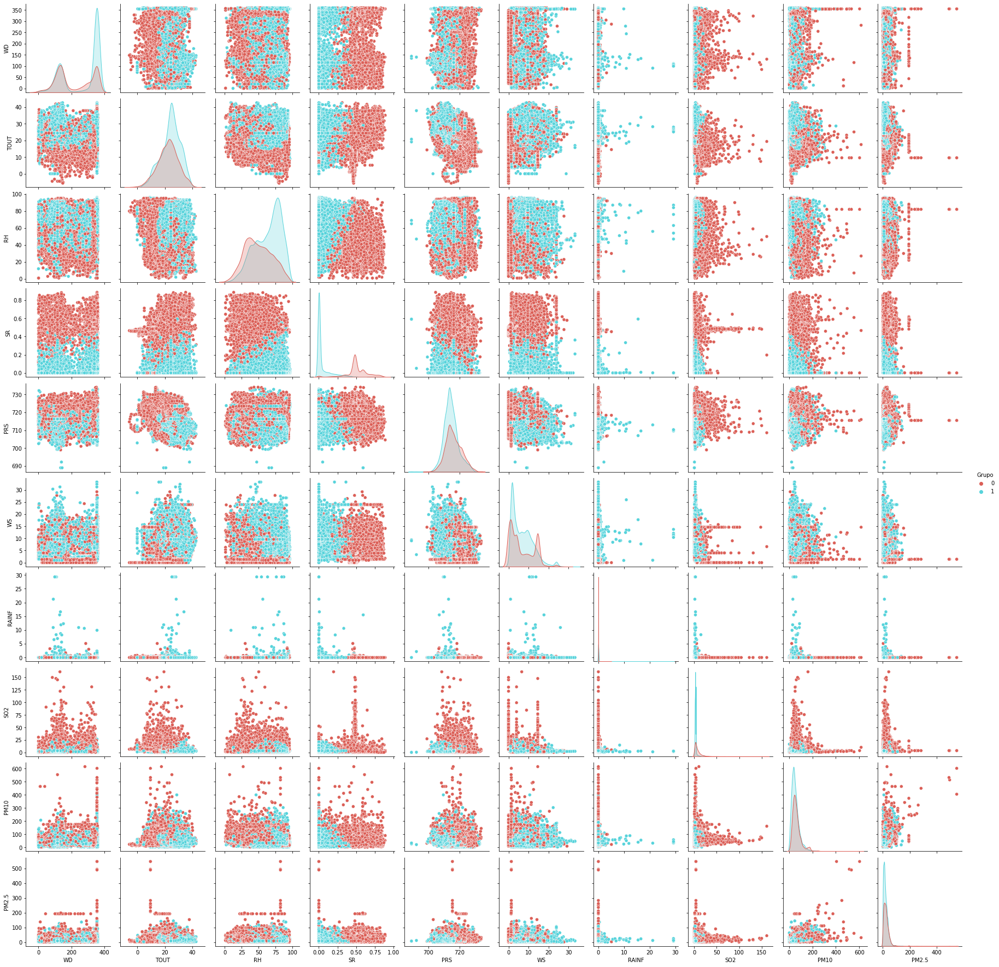

In [ ]:
sns.pairplot(ll2, hue='Grupo', palette=sns.color_palette("hls", 2))